In [13]:
import pandas as pd
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import datetime
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import re
import math
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.metrics import pairwise_distances

In [14]:
data = pd.read_csv('C:/Users/gulie/data.csv')
genre = pd.read_csv('C:/Users/gulie/data_w_genres.csv')
by_genre = pd.read_csv('C:/Users/gulie/data_by_genres.csv')
#by_artist = pd.read_csv('C:/Users/gulie/data_by_artist.csv')

In [15]:
data['release_date']= pd.to_datetime(data['release_date'], errors='coerce')
data['year'] = data['release_date'].apply(lambda time: time.year)
data = data[data.year > 1999]


In [16]:
 data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
15606,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372
15607,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948
15608,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143
15609,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009
15610,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504


In [17]:
data['artists']=data.artists.apply(lambda x: x.strip('[]'))
data['artists']=data.artists.apply(lambda x: x.strip("''"))
#data['artists']=data.artists.apply(lambda x: x.strip(r'[^\w\s]+'))
#genre['artists']=genre.artists.apply(lambda x: x.strip('"" "'))

In [18]:
#all columns in genre dataset removed and only genres and artists remain

data = data.explode("artists",ignore_index=True)
gcolumns = [x for x in genre.columns]

gcolumns = gcolumns[2:]
genre.drop(labels=gcolumns,axis=1,inplace=True)

genre.head()

,genres,artists
0,show tunes,"""Cats"" 1981 Original London Cast"
1,[],"""Cats"" 1983 Broadway Cast"
2,[],"""Fiddler On The Roof” Motion Picture Chorus"
3,[],"""Fiddler On The Roof” Motion Picture Orchestra"
4,[],"""Joseph And The Amazing Technicolor Dreamcoat""..."


In [19]:
# merge genres on artists
data = data.merge(genre,on='artists',how='left')

#remove null and non a number values
def remove_null(L):
    
    if type(L) == float:
        if math.isnan(L):
            return []
    else: 
        return L
data["genres"] = data["genres"].apply(remove_null)

In [20]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [21]:
print(data['id'].info())

<class 'pandas.core.series.Series'>
Int64Index: 41450 entries, 0 to 41449
Series name: id
Non-Null Count  Dtype 
--------------  ----- 
41450 non-null  object
dtypes: object(1)
memory usage: 647.7+ KB
None


In [22]:
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,genres
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,2000-07-10,0.0281,173.372,"permanent wave, pop"
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,2000-10-31,0.2690,94.948,"atl hip hop, dirty south rap, hip hop, rap, so..."
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,2000-10-24,0.0584,105.143,"alternative metal, nu metal, post-grunge, rap ..."
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,2000-01-01,0.0286,99.009,"alternative metal, nu metal, pop rock, post-gr..."
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,2000-05-23,0.0572,104.504,"detroit hip hop, hip hop, rap"


In [23]:
by_genre.head()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [24]:
c = 50
scaling = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters = c))])
X = by_genre.select_dtypes(np.number)
scaling.fit(X)
scaling = scaling.predict(X)
by_genre['cluster_genre'] = scaling

In [25]:
from sklearn.manifold import TSNE

tsne = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_fit = tsne.fit_transform(X)
plot = pd.DataFrame(columns=['energy', 'acousticness'], data=genre_fit)
plot['genre'] = by_genre['genres']
plot['clusterg'] = by_genre['cluster_genre']

fig = px.scatter(
    plot, x='energy', y='acousticness', color='clusterg', hover_data=['energy', 'acousticness', 'genre'])
fig.show()

C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\gulie\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.112755
[t-SNE] KL divergence after 1000 iterations: 1.388547


In [26]:
kmodel = Pipeline([('scaler', StandardScaler()), 
                     ('kmeans', KMeans(n_clusters=c, init='k-means++', random_state= 42))])

y = data.select_dtypes(np.number)
columns = list(y.columns)
kmodel= kmodel.fit(y)
kmodel = kmodel.predict(y)
data['cluster'] = kmodel

In [27]:
scale = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])

song_fit = scale.fit_transform(y)

scaled = pd.DataFrame(columns=['valence', 'acousticness'], data=song_fit)

scaled['artist'] = data['artists']

scaled['title'] = data['name']

scaled['date'] = data['year']

scaled['cluster'] = data['cluster']

scaled['popular'] = data['popularity']

scaled['tempo'] = data['tempo']

scaled['id'] = data['id']

fig = px.scatter(scaled, x='valence', y='acousticness', color='cluster', hover_data=['valence', 'acousticness', 'artist'])

fig.show()

In [28]:
#Cluster accuracy

kmeans_model = KMeans(n_clusters=c, init='k-means++', random_state= 42).fit(y)

labels = kmeans_model.labels_
silhouette_score(y, labels, metric = 'euclidean')


0.5208762323372356

<AxesSubplot:>

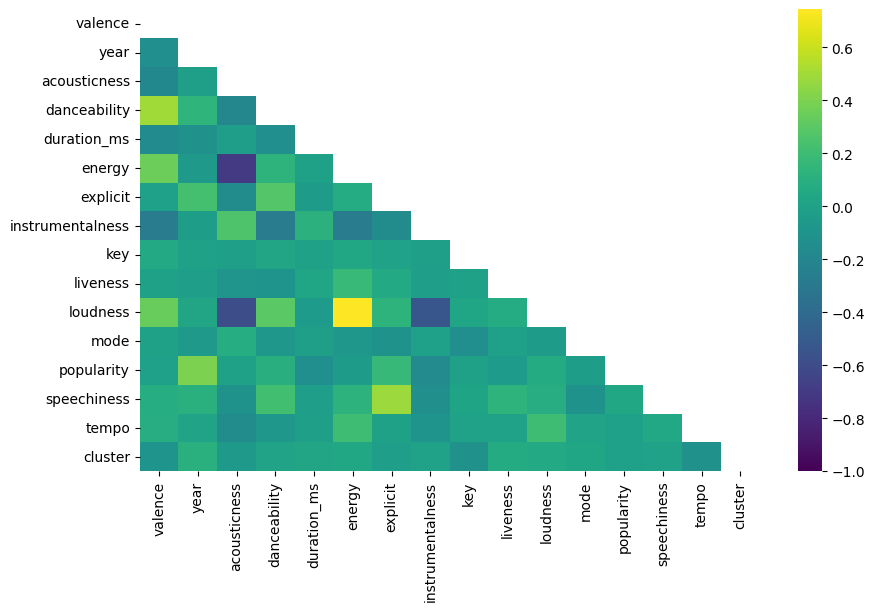

In [29]:
#sample_df = tracks[:20000]

plt.figure(figsize=(10,6))

corr = data.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,vmin=-1,cmap='viridis',annot=False)
#pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', ]], figsize=(20,12))


In [30]:
#dfs = scaled[scaled['popular']>45][['title','popular','date', 'cluster', 'tempo', 'acousticness']]
#fig = px.scatter(dfs,y='tempo', x='popular',color='cluster',size='popular')
#fig.show()

In [31]:
#displaying sample songs for each one of the clusters

df = pd.concat([plot,scaled], axis=1).set_index(scaled['cluster']).drop_duplicates()

for cluster in range(c):
    display(df.loc[cluster, ['title','cluster', 'artist', 'date', 'popular']].sample(frac=1).head(5))

,title,cluster,artist,date,popular
cluster,,,,,
0,Girls,0,The 1975,2013,58
0,ROCKSTAR 101,0,"Rihanna, Slash",2009,50
0,By Myself,0,"Christian French, Triegy",2017,65
0,Little Red Corvette,0,Prince,2001,41
0,That's How I Knew,0,Nipsey Hussle,2015,53


,title,cluster,artist,date,popular
cluster,,,,,
1,flowers,1,Nujabes,2005,47
1,Kiss You,1,Tyrone Davis,2000,35
1,Lysergic Bliss,1,of Montreal,2004,51
1,Wannabe In L.A,1,Eagles Of Death Metal,2008,47
1,The Way You Move (feat. Sleepy Brown) - Radio Mix,1,"OutKast, Sleepy Brown",2003,47


,title,cluster,artist,date,popular
cluster,,,,,
2,Fashion Zombies!,2,The Aquabats!,2005,44
2,Not Falling,2,Mudvayne,2002,41
2,Conquest,2,The White Stripes,2007,45
2,Left Behind,2,Slipknot,2001,39
2,Sophomore Slump Or Comeback Of The Year,2,Fall Out Boy,2005,54


,title,cluster,artist,date,popular
cluster,,,,,
3,Baby's Gotten Good At Goodbye - Edit,3,George Strait,2004,47
3,The Most Wonderful Day of the Year (Glee Cast ...,3,Glee Cast,2010,49
3,Untitled (How Could This Happen to Me?),3,Simple Plan,2004,50
3,Zombies,3,Childish Gambino,2016,54
3,Interlude (That's Love),3,Chance the Rapper,2013,50


,title,cluster,artist,date,popular
cluster,,,,,
4,O Magnum Mysterium: O magnum mysterium,4,"Morten Lauridsen, Chamber Choir Of Europe, Nic...",2006,53
4,Shanti (Shavasana Dub) Omstrumental,4,MC YOGI,2008,46
4,White Noise Ocean Waves,4,White! Noise,2010,49
4,Overture (For Other Halfs),4,Brian McBride,2005,43
4,Crisantemi for string orchestra,4,"Giacomo Puccini, London Symphony Orchestra, An...",2001,53


,title,cluster,artist,date,popular
cluster,,,,,
5,Say It,5,Maggie Rogers,2019,63
5,Lovefool,5,twocolors,2020,84
5,Tip of My Tongue,5,Kenny Chesney,2019,62
5,The Fox (What Does the Fox Say?),5,Ylvis,2013,64
5,Adore You,5,Harry Styles,2019,77


,title,cluster,artist,date,popular
cluster,,,,,
6,Time: The Donut of the Heart,6,J Dilla,2006,49
6,Thinking of You,6,Kesha,2012,46
6,Street Carp,6,Deftones,2000,47
6,Fuck the System,6,System Of A Down,2002,60
6,Believe,6,Staind,2008,45


,title,cluster,artist,date,popular
cluster,,,,,
7,Rain,7,Patty Griffin,2002,35
7,Cinderella,7,Steven Curtis Chapman,2007,59
7,No Good With Faces,7,Jack Johnson,2010,54
7,So Good to Me - Radio Edit,7,Chris Malinchak,2013,49
7,Go On - Edit,7,George Strait,2004,38


,title,cluster,artist,date,popular
cluster,,,,,
8,I'm So Lonesome I Could Cry,8,Johnny Cash,2002,43
8,"Medley: Caroling, Caroling / The First Noel / ...",8,Perry Como,2001,64
8,Timing Is Everything,8,Garrett Hedlund,2010,46
8,This Woman's Work,8,Greg Laswell,2009,46
8,Flint (For the Unemployed and Underpaid),8,Sufjan Stevens,2003,42


,title,cluster,artist,date,popular
cluster,,,,,
9,Done for Me (feat. Kehlani),9,"Charlie Puth, Kehlani",2018,67
9,Go Go,9,BTS,2018,72
9,Day Of The Dead,9,Hollywood Undead,2015,64
9,Take It All,9,Pop Evil,2015,53
9,Helpless,9,John Mayer,2017,60


,title,cluster,artist,date,popular
cluster,,,,,
10,Kiss the Girl - Remastered 2014,10,Samuel E. Wright,2014,59
10,Put A Little Umph In It,10,"Jagged Edge, Ashanti",2007,49
10,"Twinkle, Twinkle, Little Star",10,Raffi,2006,40
10,Quién Eres Tú,10,Grupo Laberinto,2011,49
10,New Girl (Tom's Song),10,The Walters,2014,50


,title,cluster,artist,date,popular
cluster,,,,,
11,Taking A Walk,11,Trippie Redd,2018,78
11,This Way - From SUPERFLY - Original Soundtrack,11,"Khalid, H.E.R.",2018,63
11,Toxic,11,Kehlani,2020,74
11,I Want It,11,Juice WRLD,2020,75
11,Kill Yourself (Part III),11,$uicideBoy$,2015,79


,title,cluster,artist,date,popular
cluster,,,,,
12,Dancing For Rain,12,Rise Against,2004,42
12,Metro,12,Berlin,2004,46
12,Awake and Alive,12,Skillet,2009,55
12,Snake Eater,12,Cynthia Harrell,2007,50
12,I Hate Everything About You - Live Acoustic - ...,12,Three Days Grace,2007,45


,title,cluster,artist,date,popular
cluster,,,,,
13,Midnight Thunderstorm Part 2,13,"Lightning, Thunder and Rain Storm",2009,43
13,Brown Noise - 90 Minutes,13,Sound Dreamer,2013,50
13,Dopesmoker,13,Sleep,2003,42
13,Aladdin - Storyteller,13,Chuck Riley,2004,42
13,Ocean Waves for Sleep,13,Ocean Waves For Sleep,2010,56


,title,cluster,artist,date,popular
cluster,,,,,
14,Of The Soul,14,Mac Miller,2011,55
14,People I Don't Like,14,UPSAHL,2020,68
14,Announcement,14,Unxpected,2019,66
14,Mercy.1,14,"Kanye West, Big Sean, Pusha T, 2 Chainz",2012,54
14,Geek'd (feat. Lil Baby),14,"Bhad Bhabie, Lil Baby",2018,72


,title,cluster,artist,date,popular
cluster,,,,,
15,Sleep,15,Godspeed You! Black Emperor,2000,42
15,432Hz Miracle Tone With 528Hz Solfeggio Frequency,15,PowerThoughts Meditation Club,2000,48
15,432Hz Miracle Tone: Rainy Days,15,PowerThoughts Meditation Club,2000,41
15,White Noise Fan for Babies,15,The White Noise,2011,56
15,Apache Mix,15,Tropicalísimo Apache,2002,44


,title,cluster,artist,date,popular
cluster,,,,,
16,One Love,16,Hootie & The Blowfish,2005,43
16,Breath Of Life,16,Florence + The Machine,2012,48
16,Common People,16,William Shatner,2004,37
16,En Dos,16,"""Liran Roll""",2000,46
16,Born To Raise Hell,16,Motörhead,2007,49


,title,cluster,artist,date,popular
cluster,,,,,
17,Last Night a D.J. Saved My Life,17,Indeep,2012,48
17,Santa Fe,17,Beirut,2011,56
17,Me and Julio Down by the Schoolyard,17,Paul Simon,2007,43
17,Chuper Amigos,17,Jenni Rivera,2013,54
17,Niña Bonita,17,Binomio de Oro de América,2005,59


,title,cluster,artist,date,popular
cluster,,,,,
18,What the Heck I Gotta Do,18,"Lin-Manuel Miranda, Lindsay Mendez, Anthony Ra...",2014,51
18,Worst Comes To Worst,18,Dilated Peoples,2001,51
18,Mickey Mouse Clubhouse Theme,18,They Might Be Giants (For Kids),2008,53
18,Longing For,18,Jah Cure,2007,54
18,Something About You,18,"Dyablo, MC Magic",2006,40


,title,cluster,artist,date,popular
cluster,,,,,
19,Sit Down Beside Me,19,Patrick Watson,2010,57
19,Around the Fire,19,Jeremy Soule,2013,51
19,What Are You Doing New Years Eve,19,"Denis Solee, The Jeff Steinberg Orchestra",2003,48
19,Kids,19,Kyle Dixon & Michael Stein,2016,57
19,Rock a Bye Baby with Relaxing Ocean Waves for ...,19,Baby Lullaby Academy,2015,58


,title,cluster,artist,date,popular
cluster,,,,,
20,Me Dicen el Coyote,20,Oro Norteno,2013,47
20,Ay! Papacito,20,Grupo Limite,2002,51
20,Viernes Sin Tu Amor,20,Vagon Chicano,2002,66
20,Paloma Ajena,20,"Claudio Moran, Los Universales",2010,60
20,Un Poco Loca (feat. De La Ghetto),20,"Jowell & Randy, De La Ghetto",2007,60


,title,cluster,artist,date,popular
cluster,,,,,
21,Street Rain,21,The Sleep Helpers,2017,65
21,Tranquil Rumbling Thunderstorm,21,Nature Sounds,2012,47
21,Never Ending Rain,21,The Sleep Helpers,2017,66
21,Rain Sound : Sunday Dreaming,21,Rain Sounds Factory STHLM,2017,61
21,Discover Relax with a Thunderstorm,21,Sleep Sounds of Nature,2011,55


,title,cluster,artist,date,popular
cluster,,,,,
22,Joy Of My Life,22,Chris Stapleton,2020,67
22,Faded,22,Alan Walker,2015,75
22,Nate Growing Up,22,Labrinth,2019,65
22,The Archer,22,Taylor Swift,2019,69
22,Right My Wrongs,22,Bryson Tiller,2015,72


,title,cluster,artist,date,popular
cluster,,,,,
23,L.I.F.E.G.O.E.S.O.N.,23,Noah And The Whale,2011,57
23,Voices,23,Motionless In White,2017,65
23,After the Moment,23,Craft Spells,2011,53
23,Candyland,23,Tobu,2015,59
23,Must Be Santa,23,Bob Dylan,2009,51


,title,cluster,artist,date,popular
cluster,,,,,
24,Goin Baby,24,DaBaby,2019,71
24,X,24,Lil Uzi Vert,2017,60
24,Let It Fly (feat. Travis Scott),24,"Lil Wayne, Travis Scott",2018,61
24,Out Of Luck,24,Lil Tecca,2019,63
24,Steppin On Niggas,24,"21 Savage, Metro Boomin",2020,70


,title,cluster,artist,date,popular
cluster,,,,,
25,Santa Maria (del Buen Ayre),25,Gotan Project,2001,44
25,Mr. Rager,25,Kid Cudi,2010,68
25,Anemone,25,The Brian Jonestown Massacre,2008,65
25,Mutherfucker of the Year,25,Mötley Crüe,2008,44
25,Holiday on the Moon,25,Love and Rockets,2002,42


,title,cluster,artist,date,popular
cluster,,,,,
26,Súbele a la Greibol,26,Cartel De Santa,2007,52
26,There You Go,26,P!nk,2000,56
26,Si No La Tengo,26,Diablos Locos,2010,62
26,Ten Feet Tall,26,The Devil Makes Three,2002,48
26,A Big Hunk O' Love,26,Elvis Presley,2002,50


,title,cluster,artist,date,popular
cluster,,,,,
27,Avian,27,Mac Miller,2013,57
27,Red Eye,27,YoungBoy Never Broke Again,2020,63
27,My Ex,27,PnB Rock,2019,66
27,My Affection (with PARTYNEXTDOOR),27,"Summer Walker, PARTYNEXTDOOR",2020,69
27,Paint The Sky Red,27,Rod Wave,2019,58


,title,cluster,artist,date,popular
cluster,,,,,
28,Invisible,28,Steve Valentine,2019,0
28,The Demon,28,Scott-O-Matic,2017,0
28,Deti,28,Ole Lukkoye,2012,0
28,Let The Party Start - Original Mix,28,"Junkdna, Rosie Romero, Ben Malone",2012,0
28,Mental Circus,28,WpX,2015,0


,title,cluster,artist,date,popular
cluster,,,,,
29,"Waltz in C-sharp minor, Op. 64 No. 2",29,"Frédéric Chopin, Khatia Buniatishvili",2012,61
29,The Wardrobe,29,Harry Gregson-Williams,2005,52
29,"Liebestraum No. 3 in A-Flat Major, S. 541 / 3",29,"Franz Liszt, Lang Lang",2011,58
29,Due tramonti,29,Lavinia Meijer,2013,54
29,Montero: Winter (Improvisation after the secon...,29,Gabriela Montero,2008,47


,title,cluster,artist,date,popular
cluster,,,,,
30,Rockstar,30,Call Me Karizma,2018,62
30,Name in the Sand,30,Lil Skies,2019,63
30,Sham Pain,30,Five Finger Death Punch,2018,60
30,Love Me,30,"Lil Wayne, Drake, Future",2013,68
30,Compensating (feat. Young Thug),30,"Aminé, Young Thug",2020,70


,title,cluster,artist,date,popular
cluster,,,,,
31,Blue Jeans and a Rosary,31,Kid Rock,2007,51
31,Una Aventura Más,31,Grupo Bryndis,2001,49
31,Flaws and All,31,Beyoncé,2007,44
31,You Wouldn't like Me,31,Tegan and Sara,2004,47
31,Baby Boy (feat. Beyoncé ),31,"Sean Paul, Beyoncé",2002,60


,title,cluster,artist,date,popular
cluster,,,,,
32,Opaul,32,Freddie Dredd,2018,65
32,Venom - Music From The Motion Picture,32,Eminem,2018,74
32,Cuz I Love You,32,Lizzo,2019,66
32,Clout (feat. Cardi B),32,"Offset, Cardi B",2019,73
32,Live For,32,"The Weeknd, Drake",2013,60


,title,cluster,artist,date,popular
cluster,,,,,
33,Hola' Hovito,33,JAY-Z,2001,47
33,Love Me,33,"Obie Trice, 50 Cent, Eminem",2002,42
33,All I Need,33,JAY-Z,2001,43
33,Thugs Get Lonely Too,33,"2Pac, Nate Dogg",2004,55
33,Pour Out A Little Liquor,33,"2Pac, Thug Life",2001,47


,title,cluster,artist,date,popular
cluster,,,,,
34,03' Bonnie & Clyde,34,"JAY-Z, Beyoncé",2002,65
34,Amityville,34,"Eminem, Bizarre",2000,54
34,I Just Wanna Love U (Give It 2 Me),34,JAY-Z,2000,60
34,Freedom of Speech,34,Immortal Technique,2003,40
34,The Way You Move (feat. Sleepy Brown),34,"OutKast, Sleepy Brown",2003,65


,title,cluster,artist,date,popular
cluster,,,,,
35,Sexy Lady (featuring Junior) (feat. Junior),35,"Yung Berg, Junior",2007,39
35,Apollo I : The Writing Writer - Explicit Album...,35,Coheed and Cambria,2005,41
35,Encore/Curtains Down,35,Eminem,2004,51
35,Michael Jordan,35,"Kendrick Lamar, ScHoolboy Q",2010,47
35,DUCKWORTH.,35,Kendrick Lamar,2017,64


,title,cluster,artist,date,popular
cluster,,,,,
36,How Did I Get Here,36,ODESZA,2012,61
36,The Wilhelm Scream,36,James Blake,2011,52
36,WHY AM I STILL IN LA (feat. Shlohmo & D33J),36,"Joji, D33J, Shlohmo",2018,62
36,The Look of Love,36,Chris Botti,2003,40
36,Maggie May - Remastered Version,36,Rod Stewart,2008,52


,title,cluster,artist,date,popular
cluster,,,,,
37,Comfort Inn Ending (Freestyle),37,Jhené Aiko,2013,56
37,Roulette,37,System Of A Down,2002,63
37,C U Girl,37,Steve Lacy,2015,72
37,Trista Pena,37,Gipsy Kings,2000,34
37,Unfaithful,37,Rihanna,2006,71


,title,cluster,artist,date,popular
cluster,,,,,
38,You And Me,38,Lifehouse,2005,76
38,Slow Down,38,Chase Atlantic,2016,65
38,We Come Running,38,Youngblood Hawke,2012,52
38,All My Hope,38,"Crowder, Tauren Wells",2017,55
38,I’m Ready (with Demi Lovato),38,"Sam Smith, Demi Lovato",2020,77


,title,cluster,artist,date,popular
cluster,,,,,
39,I Belong To You,39,Love Unlimited,2009,41
39,Sweet Child O' Mine - Acoustic,39,"Slash, Myles Kennedy And The Conspirators",2014,47
39,"Perdón, Perdón - HA-ASH Primera Fila - Hecho R...",39,Ha*Ash,2014,66
39,Walk Away,39,Christina Aguilera,2002,49
39,From Now On,39,"Hugh Jackman, The Greatest Showman Ensemble",2017,73


,title,cluster,artist,date,popular
cluster,,,,,
40,Undercover Martyn,40,Two Door Cinema Club,2010,65
40,Good Kisser,40,Lake Street Dive,2018,66
40,Brother,40,Gerard Way,2014,55
40,Wish You Were Here,40,Avril Lavigne,2011,66
40,cowboy in LA,40,LANY,2020,71


,title,cluster,artist,date,popular
cluster,,,,,
41,Innocence,41,NERO,2011,42
41,Skin,41,Rihanna,2010,56
41,One Of THOSE Nights,41,The Cab,2008,48
41,I'd Love To Change The World,41,Ten Years After,2002,55
41,Lonely East Texas Nights,41,Whiskey Myers,2008,56


,title,cluster,artist,date,popular
cluster,,,,,
42,The A Team,42,Ed Sheeran,2011,66
42,Birthday Suit,42,Cosmo Sheldrake,2018,59
42,Ocean,42,Lady A,2019,68
42,Just A Little Bit Of Your Heart,42,Ariana Grande,2014,68
42,Touching Heaven,42,Johnnyswim,2016,58


,title,cluster,artist,date,popular
cluster,,,,,
43,Watch Out - Max Lean & Avaro Remix,43,"The Disco Boys, Cuebrick, Max Lean, Avaro",2016,0
43,Milky Way,43,Ruslan Shalbekov,2019,0
43,Tranquila,43,J Balvin,2020,1
43,Bottom Blues,43,Brother Yusef,2018,4
43,Little Hands,43,Issa Ibrahim,2012,0


,title,cluster,artist,date,popular
cluster,,,,,
44,Only,44,"Nicki Minaj, Drake, Lil Wayne, Chris Brown",2014,51
44,Mystery of Iniquity - Live,44,Ms. Lauryn Hill,2002,43
44,BOOTY CALL (skit),44,The Kid LAROI,2020,67
44,I Believe,44,"Bill Engvall, Ron White, Jeff Foxworthy, Larry...",2004,37
44,"Grinch Schedule - From ""Dr. Seuss' How The Gri...",44,Jim Carrey,2000,34


,title,cluster,artist,date,popular
cluster,,,,,
45,El Efecto,45,"Rauw Alejandro, Chencho Corleone",2019,81
45,Daphne Blue,45,The Band CAMINO,2019,63
45,Hard On Yourself,45,"Charlie Puth, blackbear",2020,74
45,attached,45,eli.,2019,63
45,I Knew You Were Trouble.,45,Taylor Swift,2012,66


,title,cluster,artist,date,popular
cluster,,,,,
46,I Wouldn't Be A Man,46,Josh Turner,2010,48
46,You and Me (But Mostly Me),46,"Josh Gad, Andrew Rannells",2011,52
46,One Wing In The Fire,46,Trent Tomlinson,2006,53
46,Definitivamente Ya No Estoy Enamorado,46,Los Temerarios,2012,54
46,Breathe,46,"Taylor Swift, Colbie Caillat",2008,56


,title,cluster,artist,date,popular
cluster,,,,,
47,Winged Hussars,47,Sabaton,2016,59
47,The Time (Dirty Bit),47,Black Eyed Peas,2010,70
47,NO,47,Meghan Trainor,2017,72
47,H! Vltg3 (Evidence Reanimation) [feat. Pharoah...,47,"Linkin Park, DJ Babu, Pharoahe Monch, Evidence",2002,38
47,Fall To Pieces,47,Avril Lavigne,2004,55


,title,cluster,artist,date,popular
cluster,,,,,
48,Club Can't Handle Me (feat. David Guetta) - Fr...,48,Flo Rida,2010,61
48,Inocente,48,Romeo Santos,2014,64
48,Backwoods Boys (feat. Daniel Lee),48,"Charlie Farley, Daniel Lee",2014,48
48,How I'll Always Be,48,Tim McGraw,2015,51
48,Se Te Nota (with Guaynaa),48,"Lele Pons, Guaynaa",2020,92


,title,cluster,artist,date,popular
cluster,,,,,
49,Elevation,49,U2,2000,48
49,I Go Back,49,Kenny Chesney,2004,58
49,The Fallout,49,Crown The Empire,2012,49
49,The Sun,49,Maroon 5,2002,47
49,Que Sera,49,Wax Tailor,2005,61


In [32]:
display(scaled['cluster'].value_counts())
minor_cluster = scaled['cluster'].value_counts().tail(1)
print("Amount of songs in the smallest cluster: ", int(minor_cluster.values))

17    1654
5     1302
31    1299
49    1250
16    1244
9     1178
1     1173
22    1138
42    1134
41    1129
26    1114
12    1078
10    1055
32    1048
45    1038
46    1028
7     1018
2      999
38     957
23     949
37     949
27     948
48     925
25     921
33     903
34     881
30     877
11     866
8      851
24     799
20     794
40     791
19     769
6      762
47     726
3      722
14     685
0      570
36     560
18     541
35     519
43     494
29     482
39     428
28     337
4      257
21     166
44     119
15      16
13       7
Name: cluster, dtype: int64

Amount of songs in the smallest cluster:  7


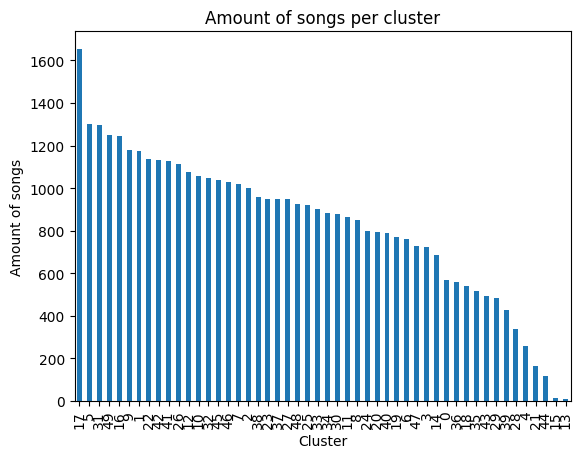

In [33]:
scaled['cluster']= kmodel

data['cluster'].value_counts().plot(kind='bar')
plt.xlabel('Cluster')
plt.ylabel('Amount of songs')
plt.title('Amount of songs per cluster')
plt.show()



In [34]:
#save above info to csv file
data.to_csv('C:/Users/gulie/cluster_data.csv')
df.to_csv('C:/Users/gulie/cluster_df.csv')

In [35]:
feats = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo', 'year']
clues = data[feats]

In [43]:
#sampling cluster
blues_clues = 16
clues = scaled[data['cluster'] == blues_clues]
clues[['title', 'artist', 'cluster', 'popular', 'id']].sort_values('popular').sample(30).sort_values('popular', ascending=False)

,title,artist,cluster,popular,id
1018,Lips Of An Angel,Hinder,16,72,40LQiUUUKXVGyNs09lHVjW
250,One Last Breath,Creed,16,69,42T2QQv3xgBlpQxaSP7lnK
25763,La Costa Del Silencio,Mägo de Oz,16,60,4mTsRdFE28MYlrZo8N4Es0
5937,The Night,Disturbed,16,58,4pADXqX5x76fDS8RmyvgwO
23607,Now,Paramore,16,56,0LBz07gAdgUukYvpFyW87y
5484,Nothing Left to Lose,Mat Kearney,16,56,23MG7PAYUQp0esP2dzWHWj
17771,I Only Wanna Be With You,Volbeat,16,55,0JRab5KK5TKRiUuLiRw0WD
5486,Guys Like Me,Eric Church,16,55,2FNYp8WnWlqkI4J0Zgea7a
32480,For Evigt,"Volbeat, Johan Olsen",16,54,7fC2VKgYfCW68vlMhmcaAj
13663,Confined,As I Lay Dying,16,51,7eWuBTL35BSBBiIjWJk0KB


array([[<AxesSubplot:xlabel='danceability', ylabel='danceability'>,
        <AxesSubplot:xlabel='instrumentalness', ylabel='danceability'>,
        <AxesSubplot:xlabel='energy', ylabel='danceability'>,
        <AxesSubplot:xlabel='speechiness', ylabel='danceability'>,
        <AxesSubplot:xlabel='valence', ylabel='danceability'>,
        <AxesSubplot:xlabel='acousticness', ylabel='danceability'>,
        <AxesSubplot:xlabel='popularity', ylabel='danceability'>,
        <AxesSubplot:xlabel='liveness', ylabel='danceability'>,
        <AxesSubplot:xlabel='loudness', ylabel='danceability'>,
        <AxesSubplot:xlabel='tempo', ylabel='danceability'>],
       [<AxesSubplot:xlabel='danceability', ylabel='instrumentalness'>,
        <AxesSubplot:xlabel='instrumentalness', ylabel='instrumentalness'>,
        <AxesSubplot:xlabel='energy', ylabel='instrumentalness'>,
        <AxesSubplot:xlabel='speechiness', ylabel='instrumentalness'>,
        <AxesSubplot:xlabel='valence', ylabel='instrumental

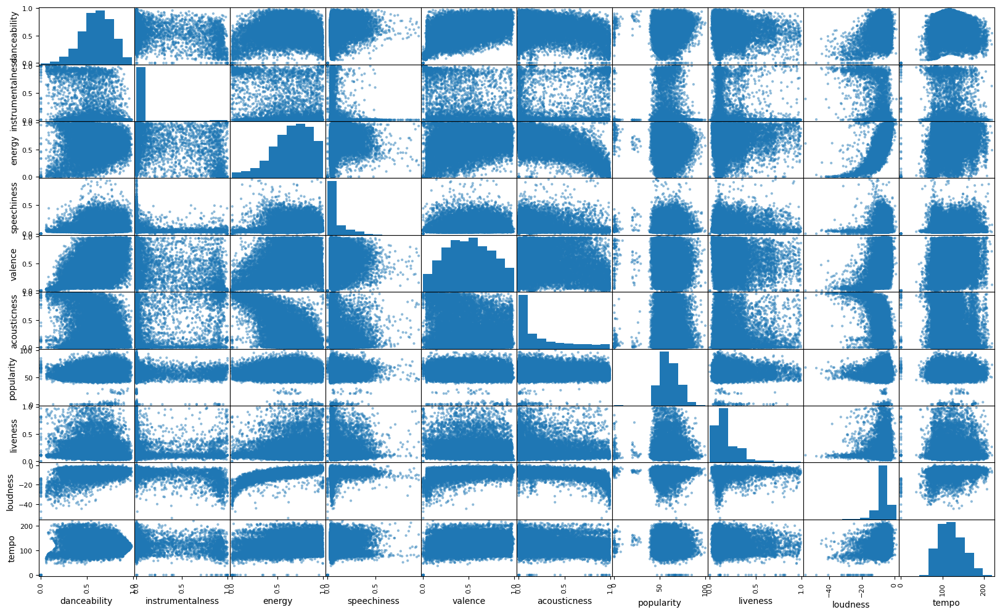

In [37]:
sample_df = data[:20000]
pd.plotting.scatter_matrix(sample_df[['danceability', 'instrumentalness', 'energy', 'speechiness', 'valence', 'acousticness', 'popularity', 'liveness', 'loudness', 'tempo']], figsize=(20,12))

In [38]:
songs = pd.read_csv('C:/Users/gulie/cluster_data.csv')


In [39]:
songs.drop(labels = ['danceability', 'instrumentalness', 'energy', 'speechiness', 'explicit', 'valence', 'acousticness', 'liveness', 'loudness', 'tempo', 'release_date', 'key', 'mode', 'duration_ms'], axis=1, inplace =True)
songs.drop(columns= songs.columns[0], axis=1, inplace=True)
songs.head(10)

,year,artists,id,name,popularity,genres,cluster
0,2000,Coldplay,3AJwUDP919kvQ9QcozQPxg,Yellow,84,"permanent wave, pop",2
1,2000,OutKast,0I3q5fE6wg7LIfHGngUTnV,Ms. Jackson,80,"atl hip hop, dirty south rap, hip hop, rap, so...",34
2,2000,Linkin Park,60a0Rd6pjrkxjPbaKzXjfq,In the End,84,"alternative metal, nu metal, post-grunge, rap ...",41
3,2000,3 Doors Down,6ZOBP3NvffbU4SZcrnt1k6,Kryptonite,78,"alternative metal, nu metal, pop rock, post-gr...",26
4,2000,Eminem,3yfqSUWxFvZELEM4PmlwIR,The Real Slim Shady,80,"detroit hip hop, hip hop, rap",34
5,2000,Disturbed,40rvBMQizxkIqnjPdEWY1v,Down with the Sickness,76,"alternative metal, nu metal, rap metal",34
6,2000,"Nelly, City Spud",3Gf5nttwcX9aaSQXRWidEZ,Ride Wit Me,74,[],33
7,2000,"Eminem, Dido",3UmaczJpikHgJFyBTAJVoz,Stan,78,[],34
8,2000,*NSYNC,62bOmKYxYg7dhrC6gH9vFn,Bye Bye Bye,71,"boy band, dance pop, europop, pop",26
9,2000,Travis Tritt,3oW6SWwGqiZSPTiAp7ZQoH,It's A Great Day To Be Alive,70,"contemporary country, country, country road, c...",17


In [40]:
#songs[:5]=songs[:5].apply(lambda x: x.replace('"', ''))
#songs['genres']=songs.genres.apply(lambda x: x.strip(" ' "))
#songs['genres'] = songs.genres.str.replace('"', '')
#songs.head(10)

In [44]:
#Recommender using song IDs

song_id = input('Type the id of your favorite song/s: ').strip().split(',')


#looks for ids in the dataset                
faves = songs[songs.id.isin(song_id)]


clust = list(faves['cluster'])
clustered = {}
for i in clust:
    clustered[i] = clust.count(i)
    
    
fave_cluster = [(l, m) for l, m in sorted(clustered.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', fave_cluster)


recommendation = songs[songs.cluster == fave_cluster].sort_values('popularity', ascending=False)


recommendation.head(10)


Type the id of your favorite song/s: 3UmaczJpikHgJFyBTAJVoz
Favorite cluster:  34


,year,artists,id,name,popularity,genres,cluster
1,2000,OutKast,0I3q5fE6wg7LIfHGngUTnV,Ms. Jackson,80,"atl hip hop, dirty south rap, hip hop, rap, so...",34
4,2000,Eminem,3yfqSUWxFvZELEM4PmlwIR,The Real Slim Shady,80,"detroit hip hop, hip hop, rap",34
202,2001,Papa Roach,5W8YXBz9MTIDyrpYaCg2Ky,Last Resort,80,"alternative metal, nu metal, rap metal, rap rock",34
7,2000,"Eminem, Dido",3UmaczJpikHgJFyBTAJVoz,Stan,78,[],34
1426,2007,DMX,1zzxoZVylsna2BQB65Ppcb,X Gon' Give It To Ya,76,"east coast hip hop, gangster rap, hardcore hip...",34
1031,2005,System Of A Down,0EYOdF5FCkgOJJla8DI2Md,B.Y.O.B.,76,"alternative metal, nu metal, rap metal",34
5,2000,Disturbed,40rvBMQizxkIqnjPdEWY1v,Down with the Sickness,76,"alternative metal, nu metal, rap metal",34
480,2002,t.A.T.u.,4bJygwUKrRgq1stlNXcgMg,All The Things She Said,73,"dance pop, girl group",34
1061,2005,"The Game, 50 Cent",4PmMVdIFpJTB9WQbmILf4p,How We Do,73,[],34
648,2003,Tego Calderon,5YJ4BVvTFmVCxUyhKejHfR,Pa' Que Retozen,73,"latin, latin hip hop, perreo, reggaeton, regga...",34


In [53]:
#Recommender using song names

song_name = input('Type song name: ').strip().split(',')

favors = songs[songs.name.isin(song_name)]

name_clust = list(favors['cluster'])
cluster_name= {}
for j in name_clust:
    cluster_name[j] = name_clust.count(j)

    
name_cluster =[(n, k) for n, k in sorted(cluster_name.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', name_cluster)

song_recs = songs[songs.cluster == name_cluster].sort_values('popularity', ascending=False)

song_recs.head(10)

Type song name: In the End
Favorite cluster:  41


,year,artists,id,name,popularity,genres,cluster
2,2000,Linkin Park,60a0Rd6pjrkxjPbaKzXjfq,In the End,84,"alternative metal, nu metal, post-grunge, rap ...",41
204,2001,System Of A Down,2DlHlPMa4M17kufBvI2lEN,Chop Suey!,80,"alternative metal, nu metal, rap metal",41
603,2003,Evanescence,0COqiPhxzoWICwFCS4eZcp,Bring Me To Life,80,alternative metal,41
422,2002,Coldplay,0BCPKOYdS2jbQ8iyB56Zns,Clocks,77,"permanent wave, pop",41
420,2002,Audioslave,3YuaBvuZqcwN3CEAyyoaei,Like a Stone,77,"alternative metal, alternative rock, modern ro...",41
417,2002,3 Doors Down,3NLrRZoMF0Lx6zTlYqeIo4,Here Without You,76,"alternative metal, nu metal, pop rock, post-gr...",41
1205,2006,The Red Jumpsuit Apparatus,4wzjNqjKAKDU82e8uMhzmr,Face Down,75,"emo, pop punk, pop rock, screamo",41
223,2001,System Of A Down,4e9eGQYsOiBcftrWXwsVco,Aerials,74,"alternative metal, nu metal, rap metal",41
6526,2011,Scorpions,0RdUX4WE0fO30VnlUbDVL6,Still Loving You,74,"album rock, german hard rock, german metal, ge...",41
1702,2008,Rise Against,1vcxF91pWs9uNwDROuiCPB,Savior,73,"chicago hardcore, chicago punk, hardcore punk,...",41


In [49]:
#Recommender using artists name

artist_name = input('Type artist name: ').strip().split(',')

artist = songs[songs.artists.isin(artist_name)]

artist_clust = list(artist['cluster'])
cluster_artist = {}
for f in artist_clust:
    cluster_artist[f] = artist_clust.count(f)

    
artist_cluster =[(d, g) for d, g in sorted(cluster_artist.items(), key=lambda item: item[1])][0][0]


print('Favorite cluster: ', artist_cluster)

artist_recs = songs[songs.cluster == artist_cluster].sort_values('popularity', ascending=False)

artist_recs.head(10)

Type artist name: Papa Roach, Eminem, Linkin Park
Favorite cluster:  34


,year,artists,id,name,popularity,genres,cluster
1,2000,OutKast,0I3q5fE6wg7LIfHGngUTnV,Ms. Jackson,80,"atl hip hop, dirty south rap, hip hop, rap, so...",34
4,2000,Eminem,3yfqSUWxFvZELEM4PmlwIR,The Real Slim Shady,80,"detroit hip hop, hip hop, rap",34
202,2001,Papa Roach,5W8YXBz9MTIDyrpYaCg2Ky,Last Resort,80,"alternative metal, nu metal, rap metal, rap rock",34
7,2000,"Eminem, Dido",3UmaczJpikHgJFyBTAJVoz,Stan,78,[],34
1426,2007,DMX,1zzxoZVylsna2BQB65Ppcb,X Gon' Give It To Ya,76,"east coast hip hop, gangster rap, hardcore hip...",34
1031,2005,System Of A Down,0EYOdF5FCkgOJJla8DI2Md,B.Y.O.B.,76,"alternative metal, nu metal, rap metal",34
5,2000,Disturbed,40rvBMQizxkIqnjPdEWY1v,Down with the Sickness,76,"alternative metal, nu metal, rap metal",34
480,2002,t.A.T.u.,4bJygwUKrRgq1stlNXcgMg,All The Things She Said,73,"dance pop, girl group",34
1061,2005,"The Game, 50 Cent",4PmMVdIFpJTB9WQbmILf4p,How We Do,73,[],34
648,2003,Tego Calderon,5YJ4BVvTFmVCxUyhKejHfR,Pa' Que Retozen,73,"latin, latin hip hop, perreo, reggaeton, regga...",34


In [54]:
import session_info
session_info.show()